In [1]:
'''
Imports
'''
import pandas as pd
import numpy as np
import random
import seaborn as sns

import matplotlib.pyplot as plt

%matplotlib inline
plt.style.use('ggplot')

In [2]:
'''
Data
'''
data = pd.read_csv('calls.tsv', sep='\t')
data

,#CHR,START,END,CELL,NORM_COUNT,COUNT,RDR,A_COUNT,B_COUNT,BAF,CLUSTER,CN_STATE
0,chr1,0,5000000,AAACCTGCACCAAAGG,2654972,547,0.801010,14,23,0.621622,3,1|2
1,chr1,0,5000000,AAACCTGCAGGACCAA,2654972,1340,0.822523,54,26,0.325000,3,2|1
2,chr1,0,5000000,AAACCTGGTAACTTCG,2654972,947,0.874127,43,17,0.283333,3,2|1
3,chr1,0,5000000,AAACCTGGTACCAGTT,2654972,1221,0.826999,47,25,0.347222,3,2|1
4,chr1,0,5000000,AAACCTGGTACCTAGT,2654972,656,1.200903,21,15,0.416667,3,1|1
...,...,...,...,...,...,...,...,...,...,...,...,...
1182745,chr22,50000000,50818468,TTTGTCAAGTAGATGT,488332,409,1.228689,3,3,0.500000,40,2|2
1182746,chr22,50000000,50818468,TTTGTCACAATTCACG,488332,132,0.744681,2,7,0.777778,40,2|2
1182747,chr22,50000000,50818468,TTTGTCATCGAAATCC,488332,212,0.866534,4,4,0.500000,40,1|1
1182748,chr22,50000000,50818468,TTTGTCATCGAACAAA,488332,186,1.249646,3,3,0.500000,40,2|2


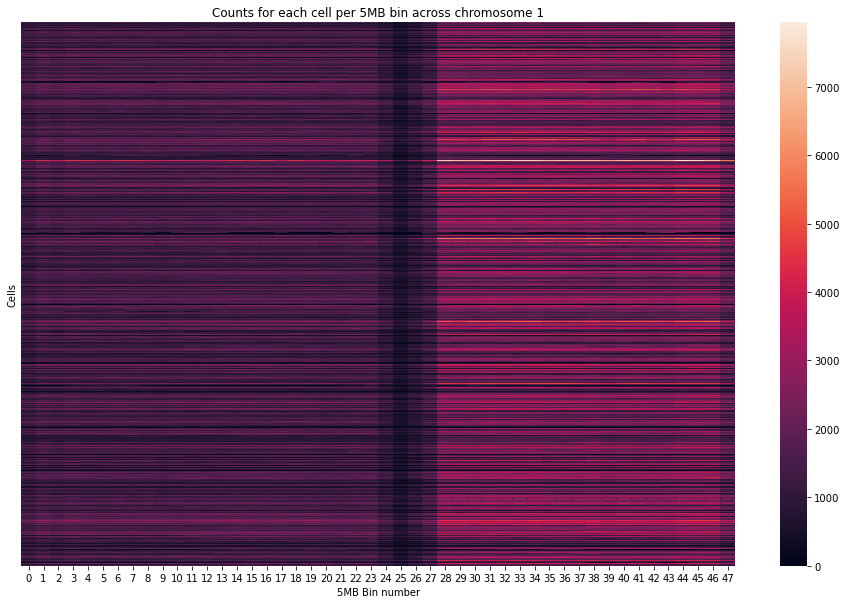

In [4]:
'''
Heatmap for counts
'''
def count_heatmap(dataframe, chromosome):
    cell_with_counts = {cell:[counts for counts in sub[sub['#CHR'] == f'chr{chromosome}']['COUNT']] for (cell, sub) in dataframe.groupby(by='CELL')}
    count_array = np.array([counts for counts in cell_with_counts.values()])

    fig, ax = plt.subplots(figsize=(16,10))
    heat = sns.heatmap(data=count_array, xticklabels=1, yticklabels=False, ax=ax)
    heat.set_ylabel('Cells')
    heat.set_xlabel('5MB Bin number')
    heat.set_title(f'Counts for each cell per 5MB bin across chromosome {chromosome}')


count_heatmap(dataframe=data, chromosome=1)


